#### <center>Ноmework_6</center>

Часть 1. EDA

Скачайте данные с Kaggle по ценам на жильё в Airbnb в Нью-Йорке:
https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data
Пройдите по основным шагам работы с данными:
выкиньте ненужные признаки: id, name, host_id, host_name, last_review
визуализируйте базовые статистики данных: распределения признаков, матрицу попарных корреляций, постройте pair plots
про результатам анализа произведите предобработку переменных

Часть 2. Preprocessing & Feature Engineering

Ваша цель получить как можно более высокие метрики качества (можно взять несколько, R2, MAE, RMSE), сконцентрировавшись на преобразовании признаков.
Опробуйте различные техники:
работа с категориальными переменными (можно начать с dummy);
замена аномалий;
различные варианты шкалирования непрерывных переменных (StandardScaler, RobustScaler, и.т.д.);
обратите внимание на распределение целевой переменной, возможно, с ней тоже можно поработать;
Попробуйте на основании имеющихся переменных создать новые, которые могли бы улучшить качество модели. Например, можно найти координаты Манхэттена (самого дорогого района) и при помощи широты и долготы, а также евклидового расстояния создать новую переменную - расстояние от квартиры до этого района. Возможно, такой признак будет работать лучше, чем просто широта и долгота.

Часть 3. Моделирование

Отложите 30% данных для тестирования.
Постройте модели простой линейной регрессии, RidgeCV, LassoCV и ElasticNetCV.
Измерьте качество каждой и визуализируйте важность признаков.
Сделайте интересные выводы :)
В ноутбуке желательно видеть:
Понятное описание: какие техники и алгоритмы были опробованы - было бы неплохо в самом начале тезисно выписать опробованные методики и их результат (помогло / не помогло).
Наличие визуализаций (не обязательно строить много графиков - можно несколько репрезентативных).
Наличие хотя бы одной модификации данных, приводящей к улучшению результатов.

### Тезисы 
#### 1. Проведен первичный анализ датасета
48 тыс. строк, есть пропущенные значения, 3 категориальных признака, много выбросов, низкая корреляция. Удалили признаки, которые не несут роли (id и т.д.). 
#### 2. Работа с пропусками
Работа в основном датасете: подбирали чем заполнить пропущенные значения (-999, 0, минимум, максимум, среднее, квантили). В результате заполнили значением -999, т.к. оно повышало корреляцию. 
Создали копию основного датасета, в нем удалили 10 тыс. пропущенных значений. 
Таким образом после работы с пропусками получили два датасета. 
#### 3. Работа с категориальными переменными
В обоих датасетах перекодировали 2 переменные с помощью One Hot Encoding, т.к. эти признаки имели небольшое количество уникальных значений. 
Третья переменная обладала большим разнообразием уникальных значений, поэтому для нее использовали Binary Encodin и Leave One Out Encoding.
Таким образом после кодирования категориальных переменных получили 4 датасета, которые проверили на следующем этапе в модели. 
#### 4. Первичная проверка в модели
Чтобы понять с каким датасетом дальше работать проверили каждый из них в модели линейной регрессии. В результате датасеты, в которых на предыдущем этапе был использован Leave One Out Encoding, продемонстрировали более высокие результаты. Дальнейшая работа проводилась на двух выбранных датасетах. 
#### 5-6. Работа с выбросами и проверка в модели
Использовали две техники: работа с помощью расстояния Махалонибуса и работа с межквартильным расстоянием. Датасет с расстоянием Махалонибуса продемонстрировал худшие результаты в модели. 
#### 7. Стандратизация
Использовали StandardScaler, RobustScaler, MinMax. Датасет, в котором ранее удаляли пропущенные значения, продемонстрировал более высокие результаты с использованием StandardScaler. Датасет, в котором пропущенные значения заменили на -999, продемонстрировал выше результаты с применением MinMax. 
#### 8. Логарифмирование целевой переменной 
Практически не дало улучшений
#### 9. Генерация нового признака
Создавали расстояние от объекта до Манхеттена с использованием Евклидового расстояния. Практически не дало улучшений модели. 
#### 10. Регуляризация
Использовали Ridge, Lasso, ElasticNet. Ridge сохранило показатели метрик от предыдущего этапа. Остальные техники штрафовали модель и ухудшали метрики. 

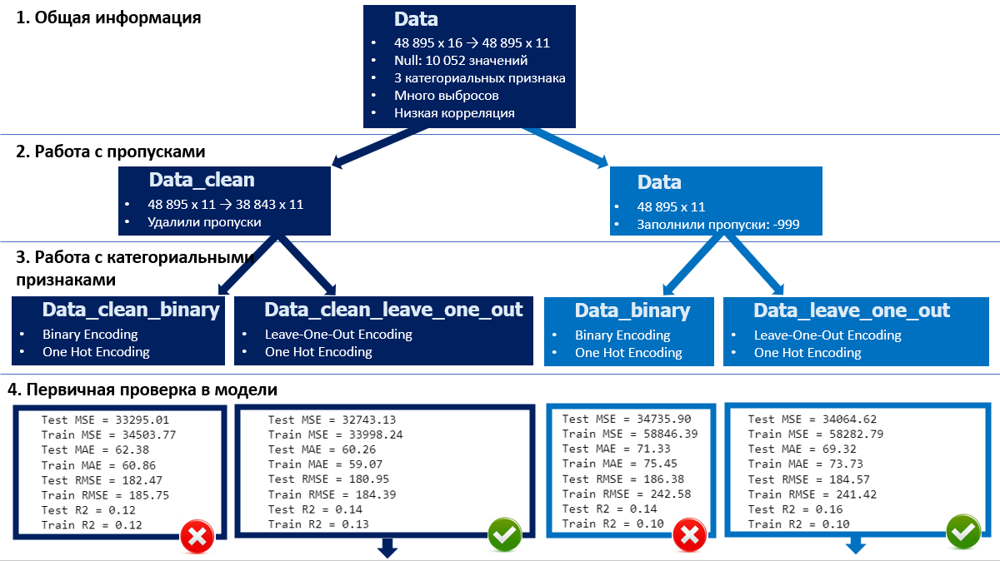

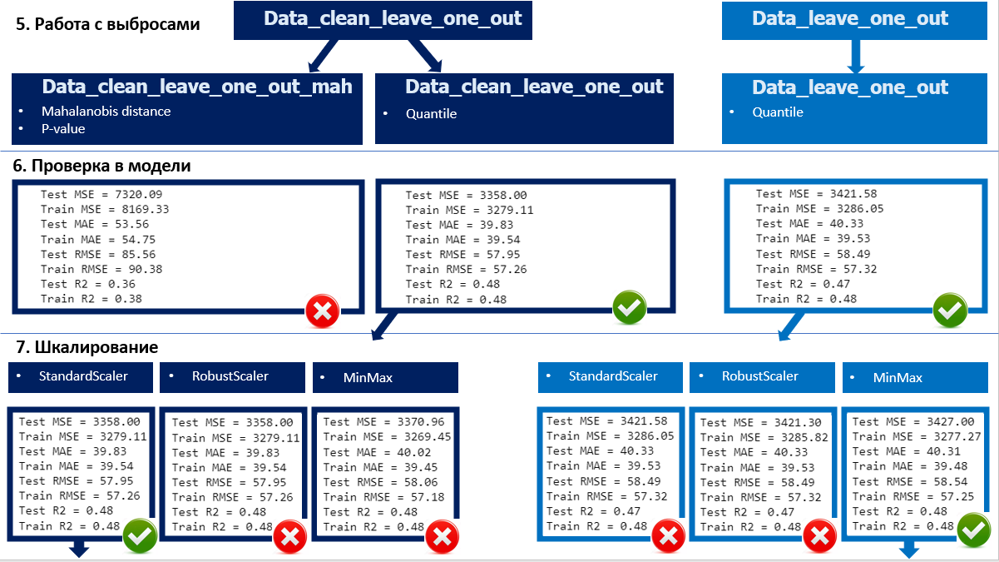

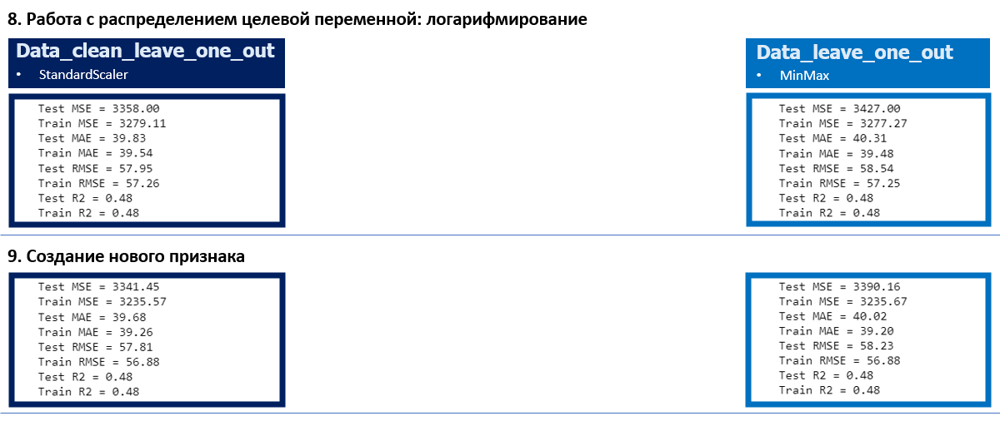

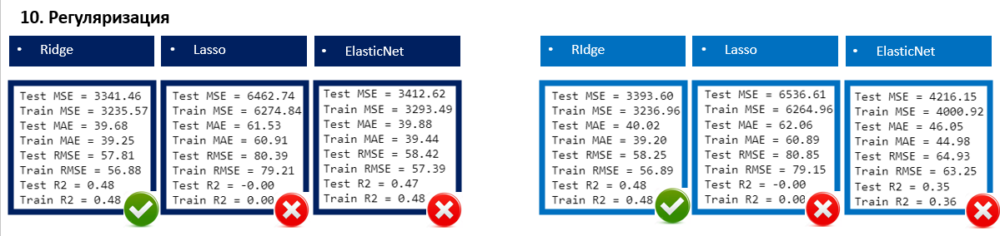

In [2110]:
import numpy as np
import numpy.linalg as la
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')

import plotly.express as px

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from sklearn import datasets
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

%matplotlib inline
np.random.seed(123)

import warnings
warnings.filterwarnings("ignore")

In [2111]:
data = pd.read_csv('AB_NYC_2019.csv')
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


### Посмотрим общую информацию по датасету

In [2112]:
data.shape

(48895, 16)

In [2113]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [2114]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

### Выводы: 
### Датасет содержит 16 колонок и 48 895 строк. Часть признаков являются категориальными. В 4 признаках присутствуют пустые ячейки. 

### Пройдите по основным шагам работы с данными: 
выкиньте ненужные признаки: id, name, host_id, host_name, last_review.

In [2115]:
# удалим ненужные признаки и проверим все ли получилось
data.drop(['id', 'name', 'host_id', 'host_name', 'last_review'], axis=1, inplace=True)
data.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


In [2116]:
data.shape

(48895, 11)

In [2117]:
data.isnull().sum()

neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [2118]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             48895 non-null  object 
 1   neighbourhood                   48895 non-null  object 
 2   latitude                        48895 non-null  float64
 3   longitude                       48895 non-null  float64
 4   room_type                       48895 non-null  object 
 5   price                           48895 non-null  int64  
 6   minimum_nights                  48895 non-null  int64  
 7   number_of_reviews               48895 non-null  int64  
 8   reviews_per_month               38843 non-null  float64
 9   calculated_host_listings_count  48895 non-null  int64  
 10  availability_365                48895 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 4.1+ MB


### Выводы:
### Осталось 11 колонок. Три из них являются категориальными, их нужно перекодировать. Одна содержит пропущенные значения, их нужно будет чем-то заполнить. 

### Визуализируйте базовые статистики данных:
распределения признаков, матрицу попарных корреляций, постройте pair plots
по результатам анализа произведите предобработку переменных

In [2119]:
data.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


array([[<AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'price'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'number_of_reviews'}>,
        <AxesSubplot:title={'center':'reviews_per_month'}>],
       [<AxesSubplot:title={'center':'calculated_host_listings_count'}>,
        <AxesSubplot:title={'center':'availability_365'}>,
        <AxesSubplot:>]], dtype=object)

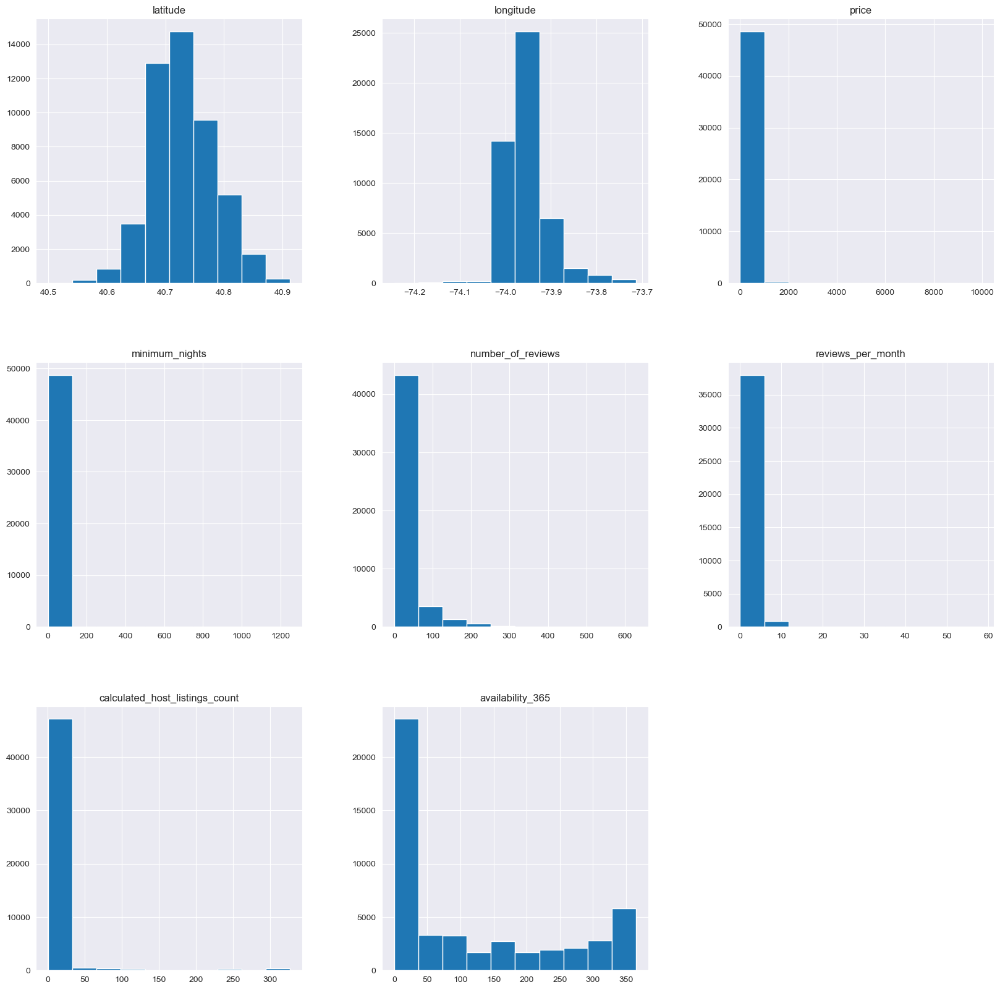

In [2120]:
data.hist(figsize=(20, 20))

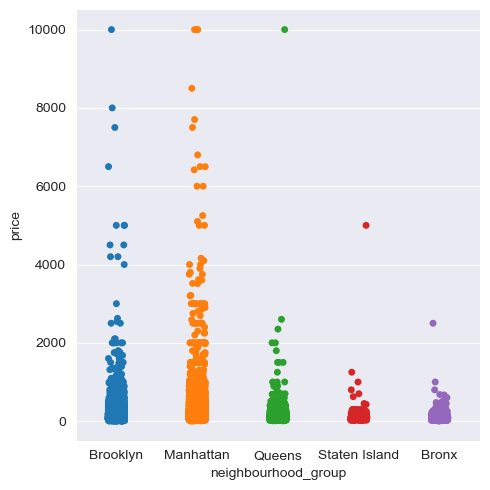

In [2121]:
sns.catplot(data=data, x='neighbourhood_group', y='price')

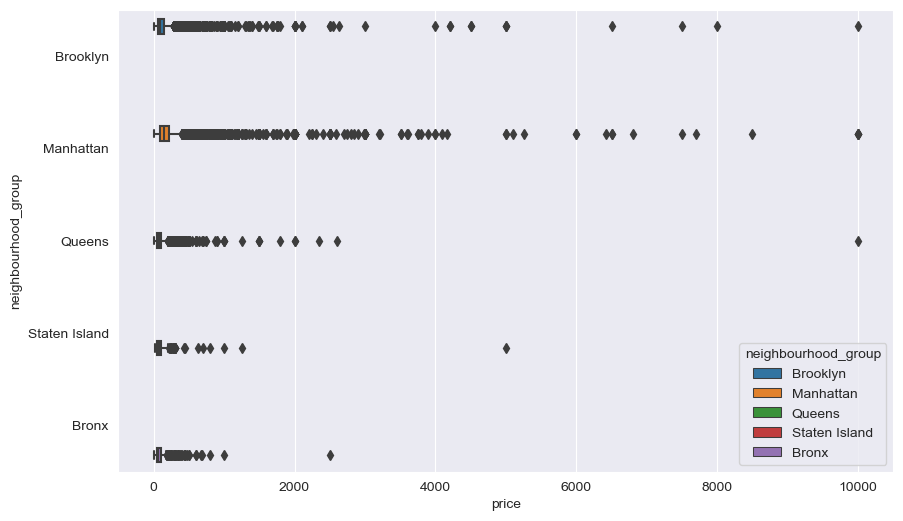

In [2122]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='price', y='neighbourhood_group', hue='neighbourhood_group')
plt.show()

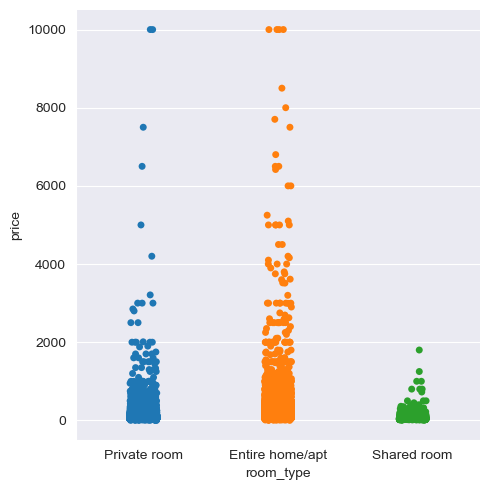

In [2123]:
sns.catplot(data=data, x='room_type', y='price')

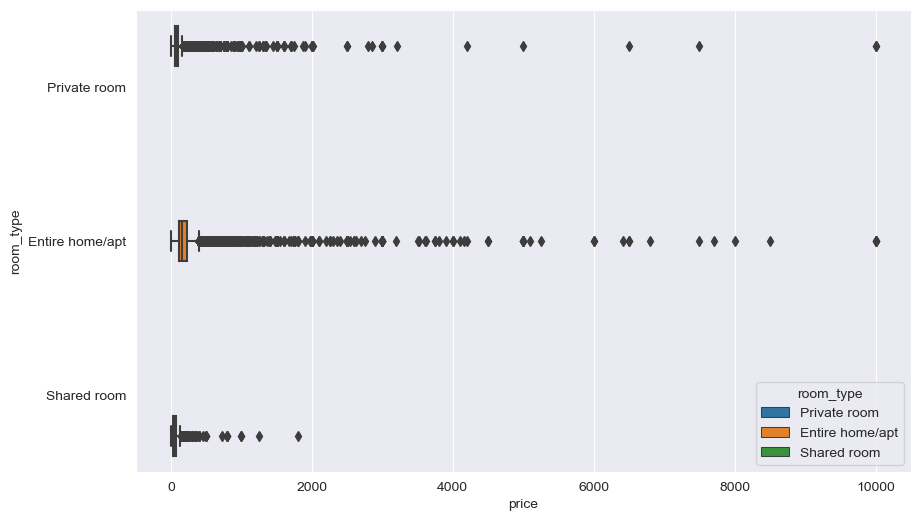

In [2124]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='price', y='room_type', hue='room_type')
plt.show()

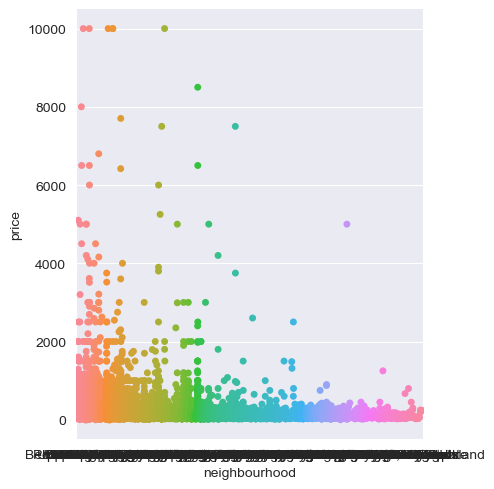

In [2125]:
sns.catplot(data=data, x='neighbourhood', y='price')

In [2126]:
fig = px.histogram(data, x='price', marginal = 'box')
fig.show()

In [2127]:
fig = px.histogram(data, x='latitude', marginal = 'box')
fig.show()

In [2128]:
fig = px.histogram(data, x='longitude', marginal = 'box')
fig.show()

In [2129]:
fig = px.histogram(data, x='number_of_reviews', marginal = 'box')
fig.show()

In [2130]:
fig = px.histogram(data, x='reviews_per_month', marginal = 'box')
fig.show()

In [2131]:
fig = px.histogram(data, x='minimum_nights', marginal = 'box')
fig.show()

In [2132]:
fig = px.histogram(data, x='calculated_host_listings_count', marginal = 'box')
fig.show()

In [2133]:
fig = px.histogram(data, x='availability_365', marginal = 'box')
fig.show()

In [2134]:
data.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.010142,0.019517,-0.010983
longitude,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.145948,-0.114713,0.082731
price,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.030608,0.057472,0.081829
minimum_nights,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.121702,0.127960,0.144303
number_of_reviews,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.549868,-0.072376,0.172028
reviews_per_month,-0.010142,0.145948,-0.030608,-0.121702,0.549868,1.000000,-0.009421,0.185791
calculated_host_listings_count,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.009421,1.000000,0.225701
availability_365,-0.010983,0.082731,0.081829,0.144303,0.172028,0.185791,0.225701,1.000000


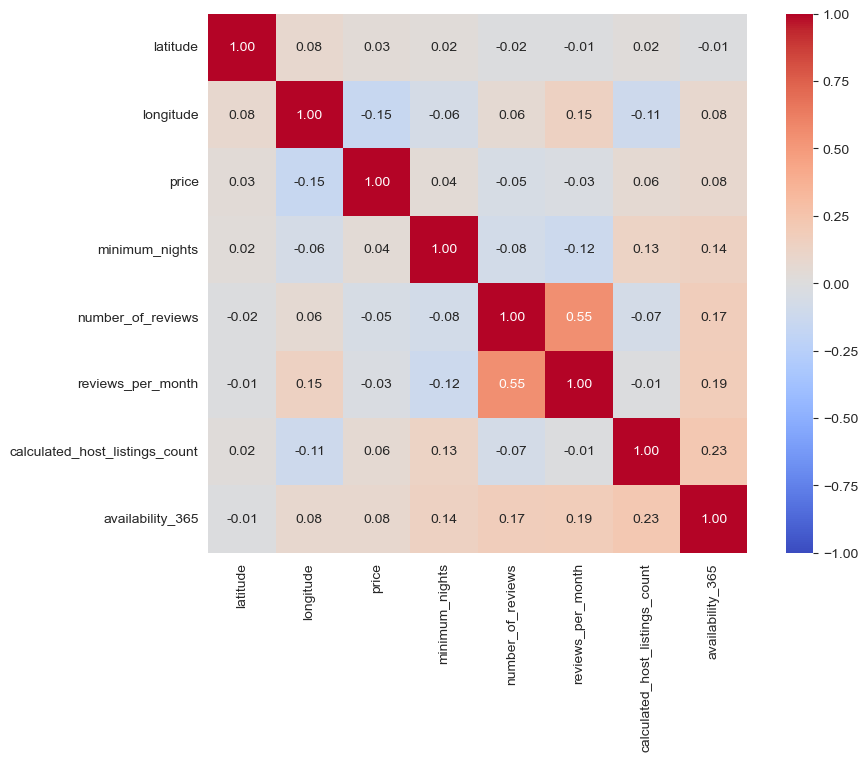

In [2135]:
plt.subplots(figsize=(10,7))
sns.heatmap(data.corr(), cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10},\
            cmap=sns.color_palette("coolwarm", 10000), vmin=-1, center=0)
plt.show()

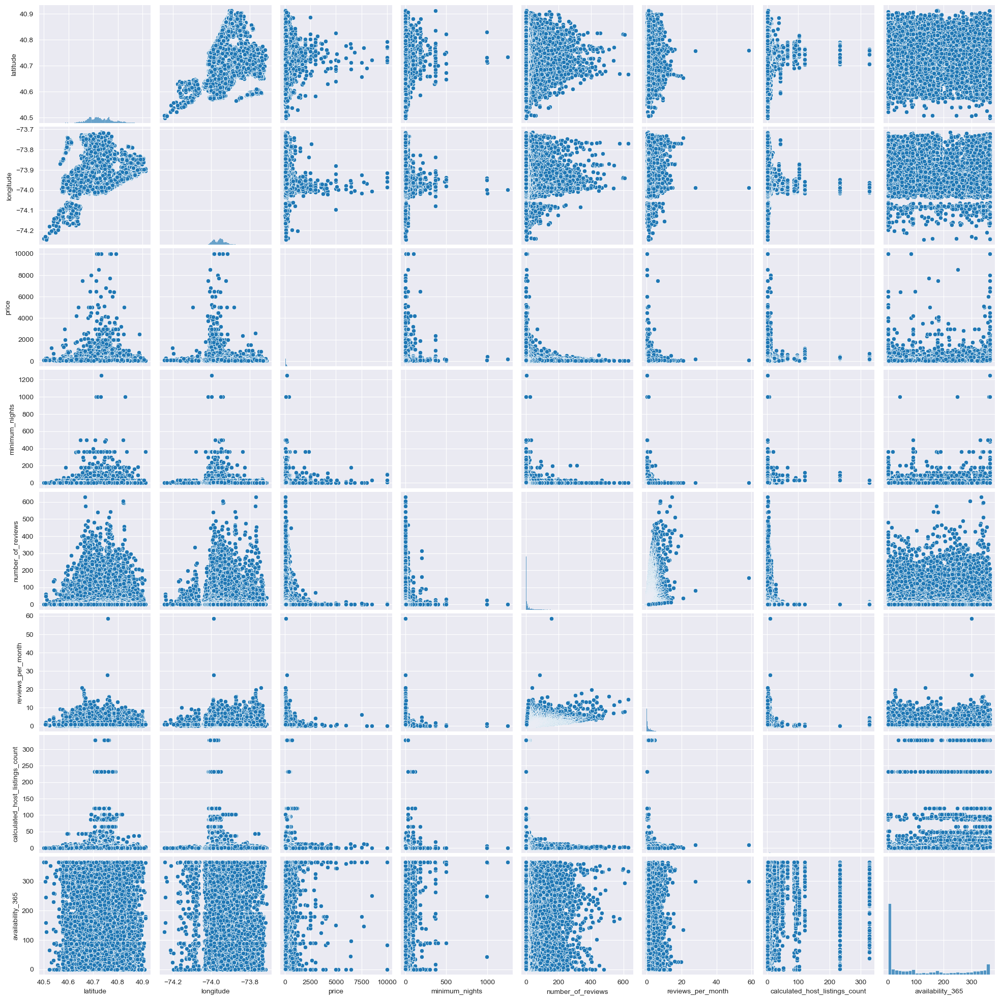

In [2136]:
sns.pairplot(data)
plt.show()

### Выводы
### Значения многих признаков имеют очень широкий диапазон. У многих признаков есть большое количество выбросов. Корреляция между признаками слабая. 

### По результатам анализа произведите предобработку переменных

### В датасете есть 10 тыс. пропусков у признака reviews_per_month. Сделаем копию датасета и разделим работу. В одном датасете будем подбирать чем заполнить пропуски. В копии удалим пустые ячейки. Полученные датасеты будем сравнивать в модели. 

In [2137]:
# Копия датасета, в которой удалим пропуски
data_clean = data.copy()
data_clean = data_clean.dropna().reset_index(drop=True)
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38843 entries, 0 to 38842
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             38843 non-null  object 
 1   neighbourhood                   38843 non-null  object 
 2   latitude                        38843 non-null  float64
 3   longitude                       38843 non-null  float64
 4   room_type                       38843 non-null  object 
 5   price                           38843 non-null  int64  
 6   minimum_nights                  38843 non-null  int64  
 7   number_of_reviews               38843 non-null  int64  
 8   reviews_per_month               38843 non-null  float64
 9   calculated_host_listings_count  38843 non-null  int64  
 10  availability_365                38843 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 3.3+ MB


In [2138]:
# В исходном датасете попробуем подобрать чем заполнить пропуски. 

print(data.reviews_per_month.corr(data.price))

-0.030608348567533118


In [2139]:
list_to_check = [-999, 0, data.reviews_per_month.min(), data.reviews_per_month.max(), data.reviews_per_month.mean(), data.reviews_per_month.median(),\
                    data.reviews_per_month.quantile(0.3), data.reviews_per_month.quantile(0.4), data.reviews_per_month.quantile(0.6),\
                    data.reviews_per_month.quantile(0.7)]

list_of_names = ['-999', '0', 'min', 'max', 'mean', 'median', 'quantile 0.3', 'quantile 0.4', 'quantile 0.6', 'quantile 0.7']
list_of_methods = ['bfill', 'ffill']

In [2140]:
for el in list_to_check:
    print('method: {}, correlation value: {:.4f}'.format(list_of_names[list_to_check.index(el)], \
                                                     data.reviews_per_month.fillna(el).corr(data.price)))
for el in list_of_methods:
    print('method: {}, correlation value: {:.4f}'.format(el, \
                                                     data.reviews_per_month.fillna(method=el).corr(data.price)))

method: -999, correlation value: -0.0852
method: 0, correlation value: -0.0506
method: min, correlation value: -0.0504
method: max, correlation value: 0.0835
method: mean, correlation value: -0.0224
method: median, correlation value: -0.0368
method: quantile 0.3, correlation value: -0.0459
method: quantile 0.4, correlation value: -0.0427
method: quantile 0.6, correlation value: -0.0295
method: quantile 0.7, correlation value: -0.0150
method: bfill, correlation value: -0.0163
method: ffill, correlation value: -0.0168


In [2141]:
# Заполним пустые значения и проверим 
data.reviews_per_month.fillna(-999, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             48895 non-null  object 
 1   neighbourhood                   48895 non-null  object 
 2   latitude                        48895 non-null  float64
 3   longitude                       48895 non-null  float64
 4   room_type                       48895 non-null  object 
 5   price                           48895 non-null  int64  
 6   minimum_nights                  48895 non-null  int64  
 7   number_of_reviews               48895 non-null  int64  
 8   reviews_per_month               48895 non-null  float64
 9   calculated_host_listings_count  48895 non-null  int64  
 10  availability_365                48895 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 4.1+ MB


In [2142]:
data.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.720687,7.029962,23.274466,-204.286900,7.143982,112.781327
std,0.054530,0.046157,240.154170,20.510550,44.550582,404.285021,32.952519,131.622289
min,40.499790,-74.244420,0.000000,1.000000,0.000000,-999.000000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


### Вывод:
### Заполнение пустых значений признака reviews_per_month случайным числом -999 позволяет увеличить корреляцию с исходных 0,03 до 0,08.   

### Теперь поработаем с категориальными признаками. 

In [2143]:
# Посмотрим разнообразие значений в категориальных признаках. 
data[['neighbourhood_group', 'neighbourhood', 'room_type']].nunique()

neighbourhood_group      5
neighbourhood          221
room_type                3
dtype: int64

### Выводы: 
### Видим, что категориальные признаки neighbourhood_group и room_type содержат небольшое разнообразие уникальных значений, поэтому можем посмотреть количество вхождений и далее перекодировать в численные. Если количество вхождений примерно одинаковое, то можем перекодировать с помощью Count Encoding или Frequency Encoding. Если количество вхождений значительно отличается, то перекодируем с помощью One Hop Encoding.   
### Признак neighbourhood содержит много уникальных значений, поэтому для его перекодирования нужен другой способ. 

In [2144]:
# Посмотрим какие значения содержатся в категориальном признаке neighbourhood_group 
data.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [2145]:
# Посмотрим сколько раз встречаются уникальные значения признака neighbourhood_group
print(data['neighbourhood_group']. value_counts ()['Brooklyn'])
print(data['neighbourhood_group']. value_counts ()['Manhattan'])
print(data['neighbourhood_group']. value_counts ()['Queens'])
print(data['neighbourhood_group']. value_counts ()['Staten Island'])
print(data['neighbourhood_group']. value_counts ()['Bronx'])

20104
21661
5666
373
1091


In [2146]:
# Посмотрим какие значения содержатся в категориальном признаке room_type 
data.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [2147]:
# Посмотрим сколько раз встречаются уникальные значения признака room_type
print(data['room_type']. value_counts ()['Private room'])
print(data['room_type']. value_counts ()['Entire home/apt'])
print(data['room_type']. value_counts ()['Shared room'])

22326
25409
1160


In [2148]:
data.neighbourhood.unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [2149]:
# Перекодируем категориальные признаки neighbourhood_group, room_type в числовые с помощью OneHotEncoder и проверим.
# Датасет data

from category_encoders import OneHotEncoder

enc = OneHotEncoder()
enc.fit_transform(data[['neighbourhood_group', 'room_type']]).head()

,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,1,0,0,0,0,1,0,0
1,0,1,0,0,0,0,1,0
2,0,1,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0
4,0,1,0,0,0,0,1,0


In [2150]:
data = data.drop(['neighbourhood_group', 'room_type'], axis = 1).join(enc.fit_transform(data[['neighbourhood_group', 'room_type']], axis = 0))
data.head()

,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,Kensington,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0
1,Midtown,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0
2,Harlem,40.80902,-73.94190,150,3,0,-999.00,1,365,0,1,0,0,0,1,0,0
3,Clinton Hill,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0
4,East Harlem,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0


In [2151]:
# Теперь работаем с датасетом data_clean
# Аналогично перекодируем категориальные признаки neighbourhood_group, room_type в числовые с помощью OneHotEncoder и проверим.

from category_encoders import OneHotEncoder

enc = OneHotEncoder()
enc.fit_transform(data_clean[['neighbourhood_group', 'room_type']]).head()

,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,1,0,0,0,0,1,0,0
1,0,1,0,0,0,0,1,0
2,1,0,0,0,0,0,1,0
3,0,1,0,0,0,0,1,0
4,0,1,0,0,0,0,1,0


In [2152]:
data_clean = data_clean.drop(['neighbourhood_group', 'room_type'], axis = 1).join(enc.fit_transform(data_clean[['neighbourhood_group', 'room_type']], axis = 0))
data_clean.head()

,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,Kensington,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0
1,Midtown,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0
2,Clinton Hill,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0
3,East Harlem,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0
4,Murray Hill,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0


### Осталось перекодировать neighbourhood в числовой признак. Для него не подойдет OneHotEncoder,  т.к. признак содержит большое количество уникальных значений, что значительно увеличит объем данных. Поэтому попробуем два подхода: Binary Encoder, Leave-One-Out Encoder. Результаты посмотрим в модели. 

In [2153]:
# Cоздадим копию датасета data и используем в ней Binary Encoder

data_binary = data.copy()
data_binary.head()

,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,Kensington,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0
1,Midtown,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0
2,Harlem,40.80902,-73.94190,150,3,0,-999.00,1,365,0,1,0,0,0,1,0,0
3,Clinton Hill,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0
4,East Harlem,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0


In [2154]:
from category_encoders.binary import BinaryEncoder

bn = BinaryEncoder()
bn.fit_transform(data_binary['neighbourhood'])[:10]

,neighbourhood_0,neighbourhood_1,neighbourhood_2,neighbourhood_3,neighbourhood_4,neighbourhood_5,neighbourhood_6,neighbourhood_7
0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1,1
3,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1
5,0,0,0,0,0,1,1,0
6,0,0,0,0,0,1,1,1
7,0,0,0,0,1,0,0,0
8,0,0,0,0,1,0,0,1
9,0,0,0,0,1,0,1,0


In [2155]:
data_binary = data_binary.drop(['neighbourhood'], axis = 1).join(bn.fit_transform(data_binary['neighbourhood'], axis = 0))
data_binary.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,...,room_type_2,room_type_3,neighbourhood_0,neighbourhood_1,neighbourhood_2,neighbourhood_3,neighbourhood_4,neighbourhood_5,neighbourhood_6,neighbourhood_7
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,...,0,0,0,0,0,0,0,0,0,1
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,...,1,0,0,0,0,0,0,0,1,0
2,40.80902,-73.94190,150,3,0,-999.00,1,365,0,1,...,0,0,0,0,0,0,0,0,1,1
3,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,...,1,0,0,0,0,0,0,1,0,0
4,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,...,1,0,0,0,0,0,0,1,0,1


In [2156]:
data_binary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   latitude                        48895 non-null  float64
 1   longitude                       48895 non-null  float64
 2   price                           48895 non-null  int64  
 3   minimum_nights                  48895 non-null  int64  
 4   number_of_reviews               48895 non-null  int64  
 5   reviews_per_month               48895 non-null  float64
 6   calculated_host_listings_count  48895 non-null  int64  
 7   availability_365                48895 non-null  int64  
 8   neighbourhood_group_1           48895 non-null  int64  
 9   neighbourhood_group_2           48895 non-null  int64  
 10  neighbourhood_group_3           48895 non-null  int64  
 11  neighbourhood_group_4           48895 non-null  int64  
 12  neighbourhood_group_5           

### Вывод:
### Если использовать Binary Encoder, то получаем небольшое увеличение количества признаков после преобразования (датасет содержит 24 колонки), есть небольшое увеличение объема данных (9 МВ vs изначально 6 МВ), но теряется интерпретируемость бинарных признаков. 

In [2157]:
# Cоздадим копию датасета data и используем в ней Leave-One-Out Encoder.

data_leave_one_out = data.copy()
data_leave_one_out.head()

,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,Kensington,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0
1,Midtown,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0
2,Harlem,40.80902,-73.94190,150,3,0,-999.00,1,365,0,1,0,0,0,1,0,0
3,Clinton Hill,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0
4,East Harlem,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0


In [2158]:
from category_encoders.leave_one_out import LeaveOneOutEncoder

loo = LeaveOneOutEncoder()
loo.fit_transform(data_leave_one_out['neighbourhood'], data_leave_one_out['price'])[:10]

,neighbourhood
0,92.563218
1,282.756477
2,118.962364
3,182.056042
4,133.246416
5,221.002066
6,107.691085
7,204.858457
8,210.985279
9,161.528610


In [2159]:
data_leave_one_out = data_leave_one_out.drop(['neighbourhood'], axis = 1).join(loo.fit_transform(data_leave_one_out['neighbourhood'], data_leave_one_out['price'], axis = 0))
data_leave_one_out.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3,neighbourhood
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0,92.563218
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0,282.756477
2,40.80902,-73.94190,150,3,0,-999.00,1,365,0,1,0,0,0,1,0,0,118.962364
3,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0,182.056042
4,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0,133.246416


In [2160]:
data_leave_one_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   latitude                        48895 non-null  float64
 1   longitude                       48895 non-null  float64
 2   price                           48895 non-null  int64  
 3   minimum_nights                  48895 non-null  int64  
 4   number_of_reviews               48895 non-null  int64  
 5   reviews_per_month               48895 non-null  float64
 6   calculated_host_listings_count  48895 non-null  int64  
 7   availability_365                48895 non-null  int64  
 8   neighbourhood_group_1           48895 non-null  int64  
 9   neighbourhood_group_2           48895 non-null  int64  
 10  neighbourhood_group_3           48895 non-null  int64  
 11  neighbourhood_group_4           48895 non-null  int64  
 12  neighbourhood_group_5           

### Вывод:
### Если использовать Leave-One_Out Encoding, то признаковое пространство не изменяется: 17 колонок, 6,3 МВ. 

### Теперь используем Binary Encoding и  Leave_One_Out Encoding для датасета data_clean, из которого предварительно убрали пустые значения. 

In [2161]:
# Cоздадим копию датасета data_clean и используем в ней Binary Encoder

data_clean_binary = data_clean.copy()
data_clean_binary.head()

,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,Kensington,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0
1,Midtown,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0
2,Clinton Hill,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0
3,East Harlem,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0
4,Murray Hill,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0


In [2162]:
bn.fit_transform(data_clean_binary['neighbourhood'])[:10]

,neighbourhood_0,neighbourhood_1,neighbourhood_2,neighbourhood_3,neighbourhood_4,neighbourhood_5,neighbourhood_6,neighbourhood_7
0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1,1
3,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1
5,0,0,0,0,0,1,1,0
6,0,0,0,0,0,1,1,1
7,0,0,0,0,1,0,0,0
8,0,0,0,0,1,0,0,1
9,0,0,0,0,1,0,0,0


In [2163]:
data_clean_binary = data_clean_binary.drop(['neighbourhood'], axis = 1).join(bn.fit_transform(data_clean_binary['neighbourhood'], axis = 0))
data_clean_binary.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,...,room_type_2,room_type_3,neighbourhood_0,neighbourhood_1,neighbourhood_2,neighbourhood_3,neighbourhood_4,neighbourhood_5,neighbourhood_6,neighbourhood_7
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,...,0,0,0,0,0,0,0,0,0,1
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,...,1,0,0,0,0,0,0,0,1,0
2,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,...,1,0,0,0,0,0,0,0,1,1
3,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,...,1,0,0,0,0,0,0,1,0,0
4,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,...,1,0,0,0,0,0,0,1,0,1


In [2164]:
data_clean_binary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38843 entries, 0 to 38842
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   latitude                        38843 non-null  float64
 1   longitude                       38843 non-null  float64
 2   price                           38843 non-null  int64  
 3   minimum_nights                  38843 non-null  int64  
 4   number_of_reviews               38843 non-null  int64  
 5   reviews_per_month               38843 non-null  float64
 6   calculated_host_listings_count  38843 non-null  int64  
 7   availability_365                38843 non-null  int64  
 8   neighbourhood_group_1           38843 non-null  int64  
 9   neighbourhood_group_2           38843 non-null  int64  
 10  neighbourhood_group_3           38843 non-null  int64  
 11  neighbourhood_group_4           38843 non-null  int64  
 12  neighbourhood_group_5           

In [2165]:
# Cоздадим копию датасета data_clean и используем в ней Leave-One-Out Encoder.

data_clean_leave_one_out = data_clean.copy()
data_clean_leave_one_out.head()

,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3
0,Kensington,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0
1,Midtown,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0
2,Clinton Hill,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0
3,East Harlem,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0
4,Murray Hill,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0


In [2166]:
loo.fit_transform(data_clean_leave_one_out['neighbourhood'], data_clean_leave_one_out['price'])[:10]

,neighbourhood
0,87.755396
1,267.626396
2,176.340292
3,132.809120
4,218.141935
5,105.973567
6,186.163292
7,186.685348
8,157.487500
9,186.647535


In [2167]:
data_clean_leave_one_out = data_clean_leave_one_out.drop(['neighbourhood'], axis = 1).join(loo.fit_transform(data_clean_leave_one_out['neighbourhood'], data_clean_leave_one_out['price'], axis = 0))
data_clean_leave_one_out.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3,neighbourhood
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0,87.755396
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0,267.626396
2,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0,176.340292
3,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0,132.809120
4,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0,218.141935


In [2168]:
data_clean_leave_one_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38843 entries, 0 to 38842
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   latitude                        38843 non-null  float64
 1   longitude                       38843 non-null  float64
 2   price                           38843 non-null  int64  
 3   minimum_nights                  38843 non-null  int64  
 4   number_of_reviews               38843 non-null  int64  
 5   reviews_per_month               38843 non-null  float64
 6   calculated_host_listings_count  38843 non-null  int64  
 7   availability_365                38843 non-null  int64  
 8   neighbourhood_group_1           38843 non-null  int64  
 9   neighbourhood_group_2           38843 non-null  int64  
 10  neighbourhood_group_3           38843 non-null  int64  
 11  neighbourhood_group_4           38843 non-null  int64  
 12  neighbourhood_group_5           

Часть 2. Preprocessing & Feature Engineering

Ваша цель получить как можно более высокие метрики качества (можно взять несколько, R2, MAE, RMSE), сконцентрировавшись на преобразовании признаков. Опробуйте различные техники: работа с категориальными переменными (можно начать с dummy); замена аномалий; различные варианты шкалирования непрерывных переменных (StandardScaler, RobustScaler, и.т.д.); обратите внимание на распределение целевой переменной, возможно, с ней тоже можно поработать; Попробуйте на основании имеющихся переменных создать новые, которые могли бы улучшить качество модели. Например, можно найти координаты Манхэттена (самого дорогого района) и при помощи широты и долготы, а также евклидового расстояния создать новую переменную - расстояние от квартиры до этого района. Возможно, такой признак будет работать лучше, чем просто широта и долгота.

### Попробуем обучить простейшую модель на каждом датасете, чтобы понять с каким датасетом работать дальше. 

In [2169]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

def split_dataset(dataset):
    X_train, X_test, y_train, y_test = train_test_split(dataset.drop('price', axis=1), dataset.price, \
                                                    test_size=0.30, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test, y_train, y_test

In [2170]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def train_model(X_train, X_test, y_train, y_test):
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    print("Test MSE = %.2f" % mean_squared_error(y_test, y_pred))
    print("Train MSE = %.2f" % mean_squared_error(y_train, y_train_pred))
    print("Test MAE = %.2f" % mean_absolute_error(y_test, y_pred))
    print("Train MAE = %.2f" % mean_absolute_error(y_train, y_train_pred))
    print("Test RMSE = %.2f" % mean_squared_error(y_test, y_pred, squared=False))
    print("Train RMSE = %.2f" % mean_squared_error(y_train, y_train_pred, squared=False))
    print("Test R2 = %.2f" % r2_score(y_test, y_pred))
    print("Train R2 = %.2f" % r2_score(y_train, y_train_pred))

In [2171]:
X_data_binary_train, X_data_binary_test, y_data_binary_train, y_data_binary_test = split_dataset(data_binary)

In [2172]:
train_model(X_data_binary_train, X_data_binary_test, y_data_binary_train, y_data_binary_test)

Test MSE = 34735.90
Train MSE = 58846.39
Test MAE = 71.33
Train MAE = 75.45
Test RMSE = 186.38
Train RMSE = 242.58
Test R2 = 0.14
Train R2 = 0.10


In [2173]:
X_data_leave_one_out_train, X_data_leave_one_out_test, y_data_leave_one_out_train, y_data_leave_one_out_test = split_dataset(data_leave_one_out)

In [2174]:
train_model(X_data_leave_one_out_train, X_data_leave_one_out_test, y_data_leave_one_out_train, y_data_leave_one_out_test)

Test MSE = 34064.62
Train MSE = 58282.79
Test MAE = 69.32
Train MAE = 73.73
Test RMSE = 184.57
Train RMSE = 241.42
Test R2 = 0.16
Train R2 = 0.10


In [2175]:
X_data_clean_binary_train, X_data_clean_binary_test, y_data_clean_binary_train, y_data_clean_binary_test = split_dataset(data_clean_binary)

In [2176]:
train_model(X_data_clean_binary_train, X_data_clean_binary_test, y_data_clean_binary_train, y_data_clean_binary_test)

Test MSE = 33295.01
Train MSE = 34503.77
Test MAE = 62.38
Train MAE = 60.86
Test RMSE = 182.47
Train RMSE = 185.75
Test R2 = 0.12
Train R2 = 0.12


In [2177]:
X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, y_data_clean_leave_one_out_test = split_dataset(data_clean_leave_one_out)

In [2178]:
train_model(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, y_data_clean_leave_one_out_test)

Test MSE = 32743.13
Train MSE = 33998.24
Test MAE = 60.26
Train MAE = 59.07
Test RMSE = 180.95
Train RMSE = 184.39
Test R2 = 0.14
Train R2 = 0.13


### Вывод.
### Датасеты, в которых использованы  Leave_One_Out Encoding демонстрируют чуть более высокие метрики, чем датасеты с Binary Encoding. Поэтому для дальнейшей работы возьмем датасеты с Leave-One-Out Encoding. 

### Работа с выбросами. 
### Попробуем работать двумя методами: межквартильного отклонения и расстояния Махалонибуса. Результаты также посмотрим в модели. 

In [2179]:
import scipy as stats

#create function to calculate Mahalanobis distance
def mahalanobis(x= None , data= None , cov= None ):

    x_mu = x - np.mean(data)
    if not cov:
        cov = np.cov(data.values.T)
    inv_covmat = np.linalg.inv(cov)
    left = np.dot(x_mu, inv_covmat)
    mahal = np.dot(left, x_mu.T)
    return mahal.diagonal()

In [2180]:
# создадим копию датасета data_clean_leave_one_out и в нем уберем выбросы с помощью расстояния Махалонибуса.
data_clean_leave_one_out_mah = data_clean_leave_one_out.copy()

In [2181]:
data_clean_leave_one_out_mah.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38843 entries, 0 to 38842
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   latitude                        38843 non-null  float64
 1   longitude                       38843 non-null  float64
 2   price                           38843 non-null  int64  
 3   minimum_nights                  38843 non-null  int64  
 4   number_of_reviews               38843 non-null  int64  
 5   reviews_per_month               38843 non-null  float64
 6   calculated_host_listings_count  38843 non-null  int64  
 7   availability_365                38843 non-null  int64  
 8   neighbourhood_group_1           38843 non-null  int64  
 9   neighbourhood_group_2           38843 non-null  int64  
 10  neighbourhood_group_3           38843 non-null  int64  
 11  neighbourhood_group_4           38843 non-null  int64  
 12  neighbourhood_group_5           

In [2182]:
#create new column in dataframe that contains Mahalanobis distance for each row
data_clean_leave_one_out_mah['mahalanobis'] = mahalanobis(x=data_clean_leave_one_out_mah, data=data_clean_leave_one_out_mah)

In [2183]:
data_clean_leave_one_out_mah.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3,neighbourhood,mahalanobis
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0,87.755396,8.312080
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0,267.626396,11.773924
2,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0,176.340292,32.093207
3,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0,132.809120,2.698648
4,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0,218.141935,4.368999


In [2184]:
from scipy.stats import chi2

#calculate p-value for each mahalanobis distance 
data_clean_leave_one_out_mah['p'] = 1 - chi2.cdf(data_clean_leave_one_out_mah['mahalanobis'], 16)

In [2185]:
data_clean_leave_one_out_mah.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3,neighbourhood,mahalanobis,p
0,40.64749,-73.97237,149,1,9,0.21,6,365,1,0,0,0,0,1,0,0,87.755396,8.312080,0.939028
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0,267.626396,11.773924,0.759390
2,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0,0,0,0,1,0,176.340292,32.093207,0.009724
3,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0,132.809120,2.698648,0.999917
4,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0,218.141935,4.368999,0.998106


In [2186]:
data_clean_leave_one_out_mah = data_clean_leave_one_out_mah[data_clean_leave_one_out_mah.p > 0.001].reset_index(drop=True)

In [2187]:
data_clean_leave_one_out_mah.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35846 entries, 0 to 35845
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   latitude                        35846 non-null  float64
 1   longitude                       35846 non-null  float64
 2   price                           35846 non-null  int64  
 3   minimum_nights                  35846 non-null  int64  
 4   number_of_reviews               35846 non-null  int64  
 5   reviews_per_month               35846 non-null  float64
 6   calculated_host_listings_count  35846 non-null  int64  
 7   availability_365                35846 non-null  int64  
 8   neighbourhood_group_1           35846 non-null  int64  
 9   neighbourhood_group_2           35846 non-null  int64  
 10  neighbourhood_group_3           35846 non-null  int64  
 11  neighbourhood_group_4           35846 non-null  int64  
 12  neighbourhood_group_5           

In [2188]:
X_data_clean_leave_one_out_mah_train, X_data_clean_leave_one_out_mah_test, y_data_clean_leave_one_out_mah_train, \
y_data_clean_leave_one_out_mah_test = split_dataset(data_clean_leave_one_out_mah)

In [2189]:
train_model(X_data_clean_leave_one_out_mah_train, X_data_clean_leave_one_out_mah_test, y_data_clean_leave_one_out_mah_train, \
y_data_clean_leave_one_out_mah_test)

Test MSE = 7320.09
Train MSE = 8169.33
Test MAE = 53.56
Train MAE = 54.75
Test RMSE = 85.56
Train RMSE = 90.38
Test R2 = 0.36
Train R2 = 0.38


### Вывод
### С помощью расстояним Махалонибуса убрали выбросы из датасета. Результат проверим в модели. 

In [2190]:
# Теперь работаем с выбросами с помощью межквартильного расстояния

def outlier_iqr(data, col, threshold=3):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [2191]:
def get_column_outliers(data, columns=None, function=outlier_iqr, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
    
    data_features = data.iloc[:, :-1]
        
    outliers = pd.Series(data=[False]*len(data), index=data_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(by='anomalies_percentage', ascending=False)
    
    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))    

In [2192]:
# датасет data_clean_leave_one_out

comparison_table, iqr_outliers = get_column_outliers(data_clean_leave_one_out, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 13641
Percentage of outliers:   35.12%


In [2193]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
neighbourhood_group_3,0.000000,0.000000,4574.0,11.775610
minimum_nights,13.000000,-8.000000,3929.0,10.115079
calculated_host_listings_count,5.000000,-2.000000,3218.0,8.284633
number_of_reviews,123.000000,-87.000000,2090.0,5.380635
neighbourhood_group_5,0.000000,0.000000,876.0,2.255233
price,473.000000,-234.000000,860.0,2.214041
room_type_3,0.000000,0.000000,846.0,2.177999
longitude,-73.792670,-74.124820,675.0,1.737765
reviews_per_month,7.510000,-5.300000,322.0,0.828978
neighbourhood_group_4,0.000000,0.000000,314.0,0.808382


In [2194]:
# датасет data_leave_one_out

comparison_table, iqr_outliers = get_column_outliers(data_leave_one_out, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 24244
Percentage of outliers:   49.58%


In [2195]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
reviews_per_month,6.200000,-4.580000,10730.0,21.944984
neighbourhood_group_3,0.000000,0.000000,5666.0,11.588097
minimum_nights,17.000000,-11.000000,5589.0,11.430617
calculated_host_listings_count,5.000000,-2.000000,4796.0,9.808774
number_of_reviews,93.000000,-68.000000,3324.0,6.798241
price,493.000000,-249.000000,1328.0,2.716024
room_type_3,0.000000,0.000000,1160.0,2.372431
neighbourhood_group_5,0.000000,0.000000,1091.0,2.231312
longitude,-73.795890,-74.123455,874.0,1.787504
neighbourhood_group_4,0.000000,0.000000,373.0,0.762859


### Выводы.
### С помощью метода межкартильного отклонения посмотрели выбросы на датасетах. Датасеты, в которых изначально очистили пустые значения, содержат меньше выбросов. Уберем выбросы и снова проверим метрики модели. 

In [2196]:
def del_outliers(data, datacolumn):
    threshold=3
    IQR = datacolumn.quantile(0.75) - datacolumn.quantile(0.25)
    up_bound = datacolumn.quantile(0.75) + (IQR * threshold)
    low_bound = datacolumn.quantile(0.25) - (IQR * threshold)
    data.drop(data[(datacolumn > up_bound) | (datacolumn < low_bound) ].index , inplace=True)
    return print(data.shape)

In [2197]:
# датасет data_cleane_leave_one_out
del_outliers(data_clean_leave_one_out, data_clean_leave_one_out['minimum_nights'])

(34914, 17)


In [2198]:
del_outliers(data_clean_leave_one_out, data_clean_leave_one_out['calculated_host_listings_count'])

(33084, 17)


In [2199]:
del_outliers(data_clean_leave_one_out, data_clean_leave_one_out['number_of_reviews'])

(31576, 17)


In [2200]:
del_outliers(data_clean_leave_one_out, data_clean_leave_one_out['reviews_per_month'])

(31338, 17)


In [2201]:
del_outliers(data_clean_leave_one_out, data_clean_leave_one_out['price'])

(30660, 17)


In [2202]:
del_outliers(data_clean_leave_one_out, data_clean_leave_one_out['longitude'])

(30121, 17)


In [2203]:
X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test = split_dataset(data_clean_leave_one_out)

In [2204]:
train_model(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
            y_data_clean_leave_one_out_test)

Test MSE = 3358.00
Train MSE = 3279.11
Test MAE = 39.83
Train MAE = 39.54
Test RMSE = 57.95
Train RMSE = 57.26
Test R2 = 0.48
Train R2 = 0.48


In [2205]:
# датасет data_leave_one_out
del_outliers(data_leave_one_out, data_leave_one_out['reviews_per_month'])

(38165, 17)


In [2206]:
del_outliers(data_leave_one_out, data_leave_one_out['minimum_nights'])

(34110, 17)


In [2207]:
del_outliers(data_leave_one_out, data_leave_one_out['calculated_host_listings_count'])

(32345, 17)


In [2208]:
del_outliers(data_leave_one_out, data_leave_one_out['number_of_reviews'])

(30774, 17)


In [2209]:
del_outliers(data_leave_one_out, data_leave_one_out['price'])

(30104, 17)


In [2210]:
del_outliers(data_leave_one_out, data_leave_one_out['longitude'])

(29574, 17)


In [2211]:
X_data_leave_one_out_train, X_data_leave_one_out_test, y_data_leave_one_out_train, y_data_leave_one_out_test = split_dataset(data_leave_one_out)

In [2212]:
train_model(X_data_leave_one_out_train, X_data_leave_one_out_test, y_data_leave_one_out_train, y_data_leave_one_out_test)

Test MSE = 3421.58
Train MSE = 3286.05
Test MAE = 40.33
Train MAE = 39.53
Test RMSE = 58.49
Train RMSE = 57.32
Test R2 = 0.47
Train R2 = 0.48


### Выводы.
### После работы с выбросами датасеты data_leave_one_out и data_clean_leave_one_out демонстрируют значительное улучшение метрик, метрики сопоставимы у обоих датасетов. Работа с выбросами с помощью расстояния Махалонобуса демонстрирует метрики хуже. 

### Шкалирование (StandardScaler, RobustScaler, MinMaxScaler). 
### Данные с использованием StandardScaler уже есть. Осталось проверить остальные два способа. 

In [2213]:
# RobustScaler

from sklearn.preprocessing import RobustScaler

def split_dataset_robust(dataset):
    X_train, X_test, y_train, y_test = train_test_split(dataset.drop('price', axis=1), dataset.price, \
                                                    test_size=0.30, random_state=42)
    scaler = RobustScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test, y_train, y_test

In [2214]:
# data_clean_leave_one_out
X_data_clean_leave_one_out_robust_train, X_data_clean_leave_one_out_robust_test, \
y_data_clean_leave_one_out_robust_train, y_data_clean_leave_one_out_robust_test = split_dataset_robust(data_clean_leave_one_out)

In [2215]:
# data_clean_leave_one_out
train_model(X_data_clean_leave_one_out_robust_train, X_data_clean_leave_one_out_robust_test, \
            y_data_clean_leave_one_out_robust_train, y_data_clean_leave_one_out_robust_test)

Test MSE = 3358.00
Train MSE = 3279.11
Test MAE = 39.83
Train MAE = 39.54
Test RMSE = 57.95
Train RMSE = 57.26
Test R2 = 0.48
Train R2 = 0.48


In [2216]:
# data_leave_one_out
X_data_leave_one_out_robust_train, X_data_leave_one_out_robust_test, \
y_data_leave_one_out_robust_train, y_data_leave_one_out_robust_test = split_dataset_robust(data_leave_one_out)

In [2217]:
# data_leave_one_out
train_model(X_data_leave_one_out_robust_train, X_data_leave_one_out_robust_test, \
            y_data_leave_one_out_robust_train, y_data_leave_one_out_robust_test)

Test MSE = 3421.30
Train MSE = 3285.82
Test MAE = 40.33
Train MAE = 39.53
Test RMSE = 58.49
Train RMSE = 57.32
Test R2 = 0.47
Train R2 = 0.48


In [2218]:
#MinMaxScaler 
from sklearn.preprocessing import MinMaxScaler

def split_dataset_minmax(dataset):
    X_train, X_test, y_train, y_test = train_test_split(dataset.drop('price', axis=1), dataset.price, \
                                                    test_size=0.33, random_state=42)
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test, y_train, y_test

In [2219]:
# data_clean_leave_one_out
X_data_clean_leave_one_out_minmax_train, X_data_clean_leave_one_out_minmax_test, \
y_data_clean_leave_one_out_minmax_train, y_data_clean_leave_one_out_minmax_test = split_dataset_minmax(data_clean_leave_one_out)

In [2220]:
# data_clean_leave_one_out
train_model(X_data_clean_leave_one_out_minmax_train, X_data_clean_leave_one_out_minmax_test, \
            y_data_clean_leave_one_out_minmax_train, y_data_clean_leave_one_out_minmax_test)

Test MSE = 3370.96
Train MSE = 3269.45
Test MAE = 40.02
Train MAE = 39.45
Test RMSE = 58.06
Train RMSE = 57.18
Test R2 = 0.48
Train R2 = 0.48


In [2221]:
# data_leave_one_out
X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test = split_dataset_minmax(data_leave_one_out)

In [2222]:
# data_leave_one_out
train_model(X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
            y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test)

Test MSE = 3427.00
Train MSE = 3277.27
Test MAE = 40.31
Train MAE = 39.48
Test RMSE = 58.54
Train RMSE = 57.25
Test R2 = 0.48
Train R2 = 0.48


### Выводы: 
### Использование трех скалеров StandardScaler, RobustScaler, MinMaxScaler не дает преимущест между собой. 

### Работа с целевой переменной
### 1) Выбросы уже убрали
### 2) Попробуем поработать с распределением

In [2223]:
# Логарифмируем целевую переменную, далее проверим модель. 
from scipy import stats
from scipy.stats import norm

def target_dist(data):

    plt.figure(figsize=(10,7))
    sns.distplot(data.price, fit=norm)

    # фитим распределение
    (mu, sigma) = norm.fit(data.price)

    plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    plt.ylabel('Frequency')
    plt.title('Price Density Distribution')

    plt.figure(figsize=(10,7))
    stats.probplot(data['price'], plot=plt)
    plt.show()

In [2224]:
def target_log(data):

    # берем логарифм от цены
    data.LogPrice = np.log1p(data.price)

    plt.figure(figsize=(10,7))
    sns.distplot(data.LogPrice, fit=norm)

    # фитим распределение на логарифм от цены
    (mu, sigma) = norm.fit(data.LogPrice)

    plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    plt.ylabel('Frequency')
    plt.title('Log of Price Density Distribution')

    plt.figure(figsize=(10,7))
    stats.probplot(data.LogPrice, plot=plt)
    plt.show()

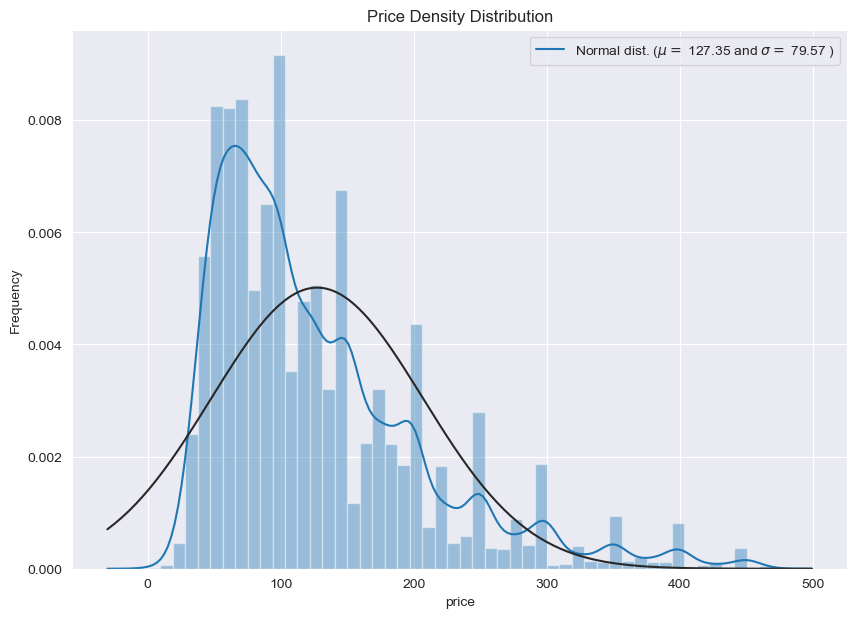

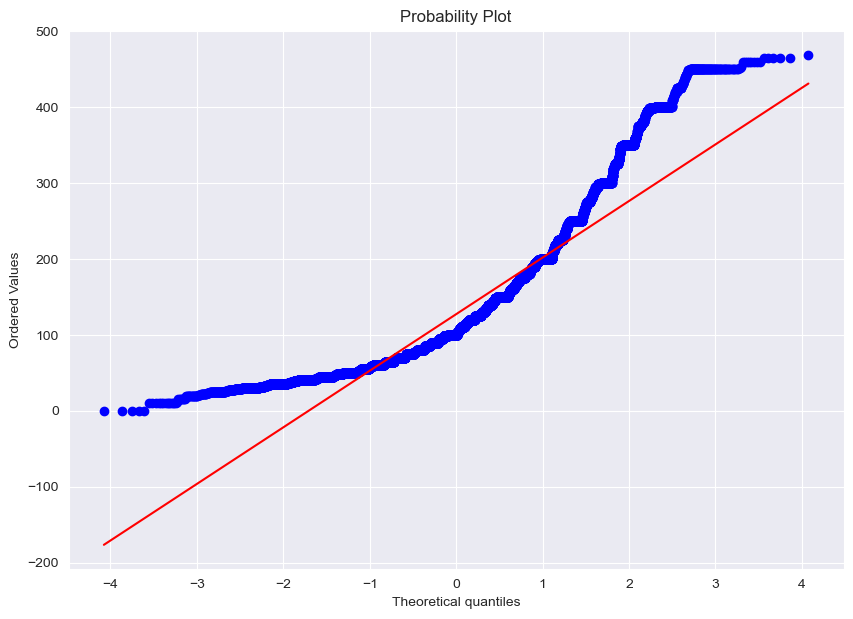

In [2225]:
# data_clean_leave_one_out
target_dist(data_clean_leave_one_out)

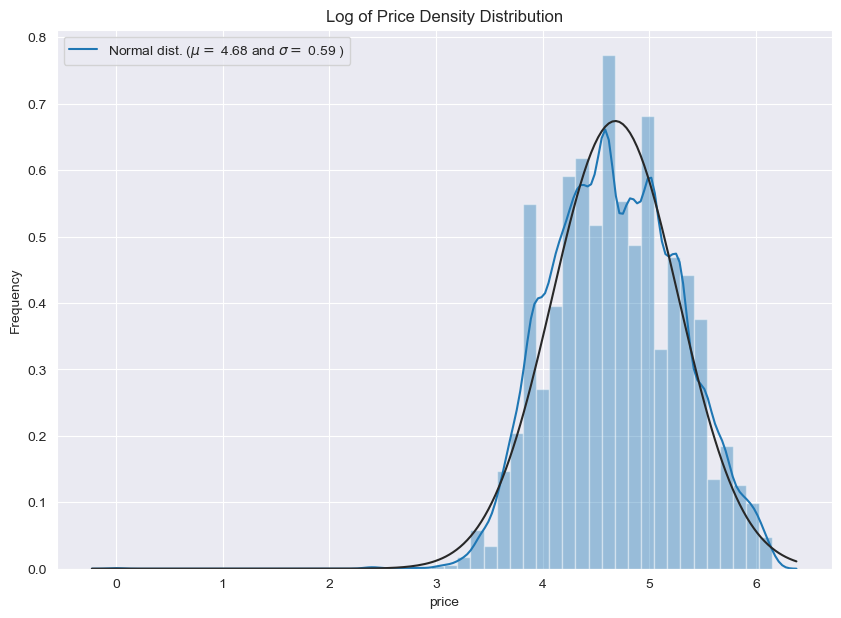

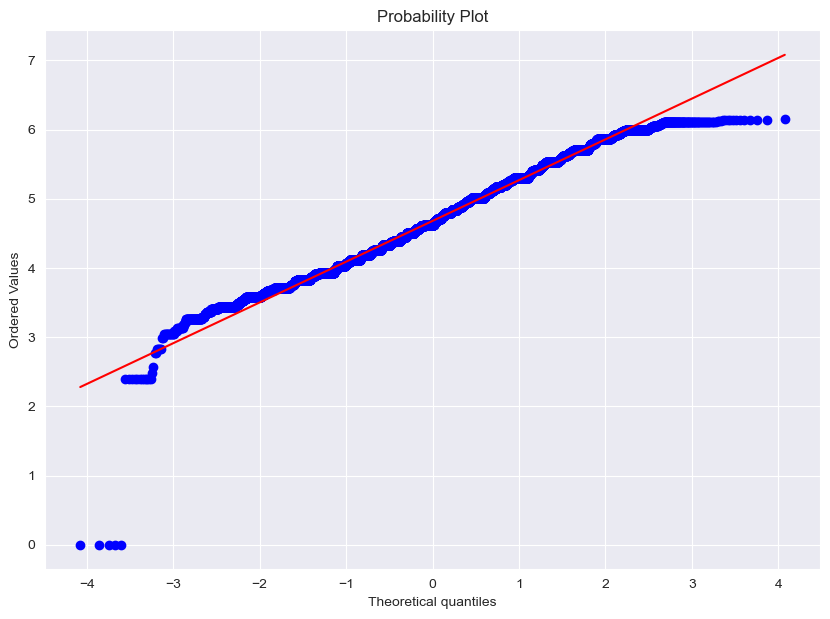

In [2226]:
# data_clean_leave_one_out
target_log(data_clean_leave_one_out)

In [2227]:
# data_clean_leave_one_out
X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test = split_dataset(data_clean_leave_one_out)

In [2228]:
# data_clean_leave_one_out
train_model(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test)

Test MSE = 3358.00
Train MSE = 3279.11
Test MAE = 39.83
Train MAE = 39.54
Test RMSE = 57.95
Train RMSE = 57.26
Test R2 = 0.48
Train R2 = 0.48


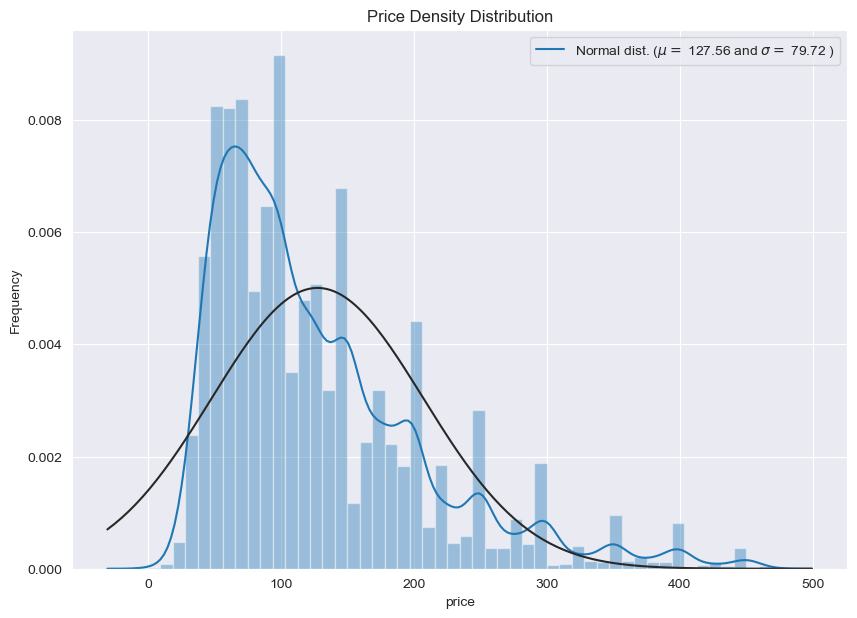

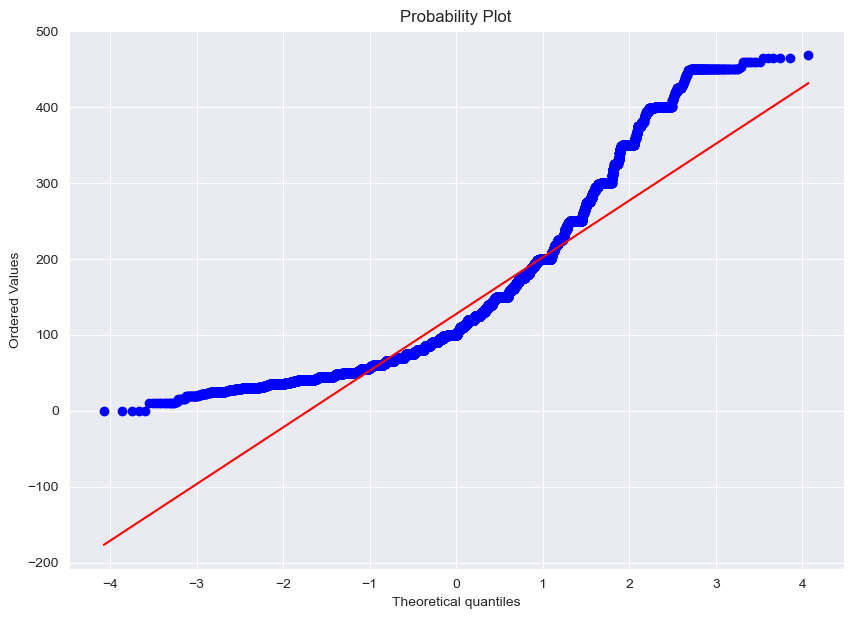

In [2229]:
# data_leave_one_out
target_dist(data_leave_one_out)

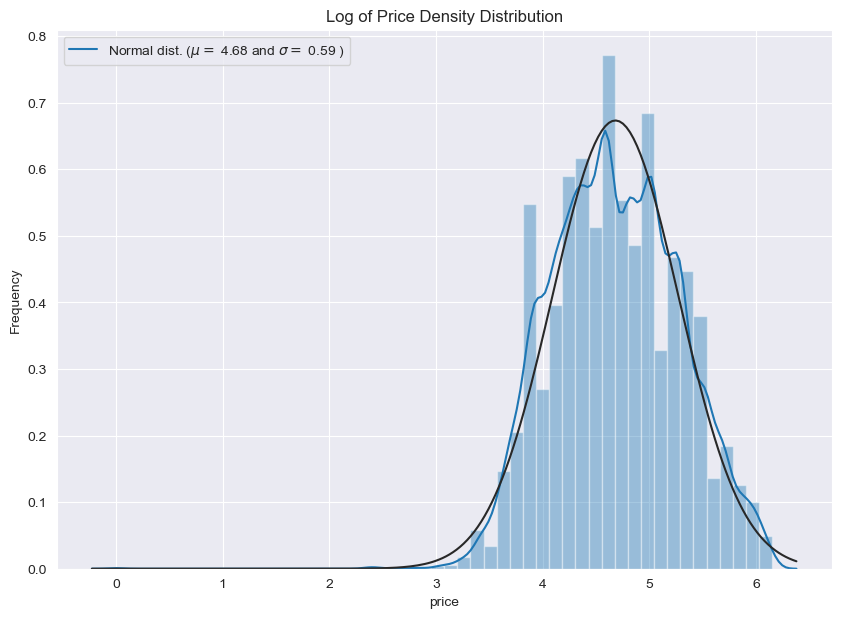

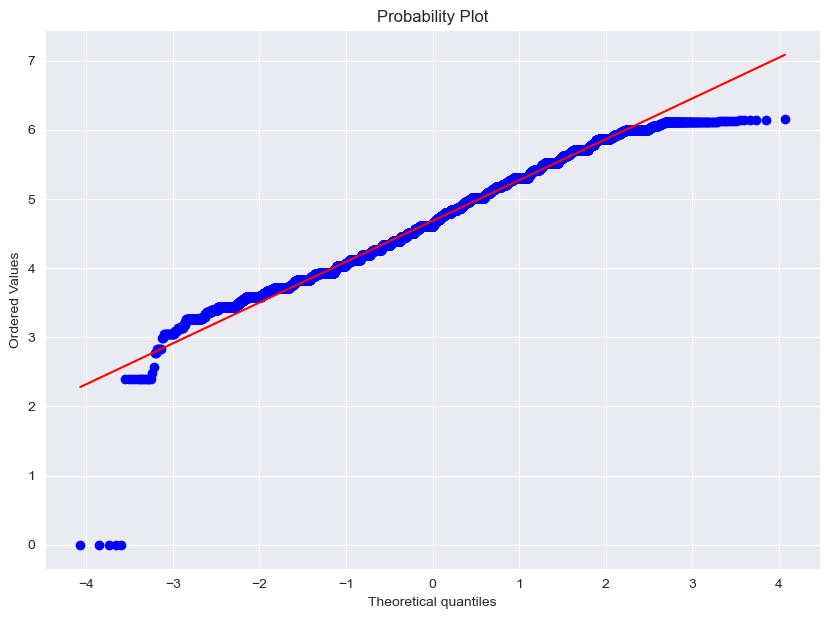

In [2230]:
# data_leave_one_out
target_log(data_leave_one_out)

In [2231]:
# data_leave_one_out
X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test = split_dataset_minmax(data_leave_one_out)

In [2232]:
# data_leave_one_out
train_model(X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
            y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test)

Test MSE = 3427.00
Train MSE = 3277.27
Test MAE = 40.31
Train MAE = 39.48
Test RMSE = 58.54
Train RMSE = 57.25
Test R2 = 0.48
Train R2 = 0.48


### Выводы.
### Логарифмирование целевой переменной не дало улучшения метрик.

### Создание новой переменной

### Попробуйте на основании имеющихся переменных создать новые, которые могли бы улучшить качество модели. Например, можно найти координаты Манхэттена (самого дорогого района) и при помощи широты и долготы, а также евклидового расстояния создать новую переменную - расстояние от квартиры до этого района. Возможно, такой признак будет работать лучше, чем просто широта и долгота.

In [2233]:
def manhattan_coordinate(data):
    manhattan_latitude = 40.75525
    manhattan_longitude = -73.98693
    manhattan_coord = np.zeros((data.shape[0], 2), 'float')
    
    for row in manhattan_coord:
        row[0] = manhattan_latitude
        row[1] = manhattan_longitude 
        
    return manhattan_coord

In [2234]:
# data_clean_leave_one_out
manhattan_clean_loo = manhattan_coordinate(data_clean_leave_one_out)

In [2235]:
def coordinate (data):
    coordinate = np.array([data.latitude, data.longitude])
    coordinate = coordinate.T     
    return coordinate    

In [2236]:
# data_clean_leave_one_out
coord_clean_loo = coordinate (data_clean_leave_one_out)

In [2237]:
def cal_euclidean(coord, manhattan): 
    distance = np.zeros((coord.shape[0], 1), 'float')
    for i in range(len(distance)):
        distance[i] = np.linalg.norm(coord[i] - manhattan[i])
    return distance

In [2238]:
# data_clean_leave_one_out
distance_clean_loo = cal_euclidean(coord_clean_loo, manhattan_clean_loo)

In [2239]:
print(distance_clean_loo[:5])

[[0.00355563]
 [0.06095302]
 [0.0141344 ]
 [0.05052852]
 [0.05250484]]


In [2240]:
# data_clean_leave_one_out
data_clean_leave_one_out['distance'] = distance_clean_loo

In [2241]:
data_clean_leave_one_out.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3,neighbourhood,distance
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0,267.626396,0.003556
3,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0,132.809120,0.060953
4,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0,218.141935,0.014134
7,40.80178,-73.96723,79,2,118,0.99,1,0,0,1,0,0,0,1,0,0,186.685348,0.050529
9,40.80316,-73.96545,135,5,53,0.43,1,6,0,1,0,0,0,0,1,0,186.647535,0.052505


In [2242]:
# data_clean_leave_one_out
X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test = split_dataset(data_clean_leave_one_out)

In [2243]:
# data_clean_leave_one_out
train_model(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test)

Test MSE = 3341.45
Train MSE = 3235.57
Test MAE = 39.68
Train MAE = 39.26
Test RMSE = 57.81
Train RMSE = 56.88
Test R2 = 0.48
Train R2 = 0.48


In [2244]:
# data_leave_one_out
manhattan_loo = manhattan_coordinate(data_leave_one_out)

In [2245]:
# data_leave_one_out
coord_loo = coordinate (data_leave_one_out)

In [2246]:
# data_leave_one_out
distance_loo = cal_euclidean(coord_loo, manhattan_loo)

In [2247]:
print(distance_loo[:5])

[[0.00355563]
 [0.06095302]
 [0.0141344 ]
 [0.05052852]
 [0.05250484]]


In [2248]:
# data_leave_one_out
data_leave_one_out['distance'] = distance_loo

In [2249]:
data_leave_one_out.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_1,neighbourhood_group_2,neighbourhood_group_3,neighbourhood_group_4,neighbourhood_group_5,room_type_1,room_type_2,room_type_3,neighbourhood,distance
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,1,0,0,0,0,1,0,282.756477,0.003556
4,40.79851,-73.94399,80,10,9,0.10,1,0,0,1,0,0,0,0,1,0,133.246416,0.060953
5,40.74767,-73.97500,200,3,74,0.59,1,129,0,1,0,0,0,0,1,0,221.002066,0.014134
8,40.80178,-73.96723,79,2,118,0.99,1,0,0,1,0,0,0,1,0,0,210.985279,0.050529
10,40.80316,-73.96545,135,5,53,0.43,1,6,0,1,0,0,0,0,1,0,210.956853,0.052505


In [2250]:
# data_leave_one_out
X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test = split_dataset_minmax(data_leave_one_out)

In [2251]:
# data_leave_one_out
train_model(X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
            y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test)

Test MSE = 3390.16
Train MSE = 3235.67
Test MAE = 40.02
Train MAE = 39.20
Test RMSE = 58.23
Train RMSE = 56.88
Test R2 = 0.48
Train R2 = 0.48


### Выводы.
### Генерация нового признака (расстояние от объекта до Манхэттена) дала совсем незначительное улучшение метрик модели. 

### Часть 3. Моделирование

Отложите 30% данных для тестирования. Постройте модели простой линейной регрессии, RidgeCV, LassoCV и ElasticNetCV. Измерьте качество каждой и визуализируйте важность признаков. Сделайте интересные выводы :) В ноутбуке желательно видеть: Понятное описание: какие техники и алгоритмы были опробованы - было бы неплохо в самом начале тезисно выписать опробованные методики и их результат (помогло / не помогло). Наличие визуализаций (не обязательно строить много графиков - можно несколько репрезентативных). Наличие хотя бы одной модификации данных, приводящей к улучшению результатов.

### Результаты линейной регрессии уже есть, попробуем использовать другие модели. 

In [2252]:
from sklearn.linear_model import Ridge

def train_model_ridge(X_train, X_test, y_train, y_test):
    model = Ridge(alpha = 10)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    print("Test MSE = %.2f" % mean_squared_error(y_test, y_pred))
    print("Train MSE = %.2f" % mean_squared_error(y_train, y_train_pred))
    print("Test MAE = %.2f" % mean_absolute_error(y_test, y_pred))
    print("Train MAE = %.2f" % mean_absolute_error(y_train, y_train_pred))
    print("Test RMSE = %.2f" % mean_squared_error(y_test, y_pred, squared=False))
    print("Train RMSE = %.2f" % mean_squared_error(y_train, y_train_pred, squared=False))
    print("Test R2 = %.2f" % r2_score(y_test, y_pred))
    print("Train R2 = %.2f" % r2_score(y_train, y_train_pred))

In [2253]:
from sklearn.linear_model import Lasso

def train_model_lasso(X_train, X_test, y_train, y_test):

    model = Lasso(alpha = 100)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    print("Test MSE = %.2f" % mean_squared_error(y_test, y_pred))
    print("Train MSE = %.2f" % mean_squared_error(y_train, y_train_pred))
    print("Test MAE = %.2f" % mean_absolute_error(y_test, y_pred))
    print("Train MAE = %.2f" % mean_absolute_error(y_train, y_train_pred))
    print("Test RMSE = %.2f" % mean_squared_error(y_test, y_pred, squared=False))
    print("Train RMSE = %.2f" % mean_squared_error(y_train, y_train_pred, squared=False))
    print("Test R2 = %.2f" % r2_score(y_test, y_pred))
    print("Train R2 = %.2f" % r2_score(y_train, y_train_pred))

In [2254]:
from sklearn.linear_model import ElasticNet

def train_model_elastic(X_train, X_test, y_train, y_test):

    model = ElasticNet(alpha = 0.5,  l1_ratio= 0.5)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    print("Test MSE = %.2f" % mean_squared_error(y_test, y_pred))
    print("Train MSE = %.2f" % mean_squared_error(y_train, y_train_pred))
    print("Test MAE = %.2f" % mean_absolute_error(y_test, y_pred))
    print("Train MAE = %.2f" % mean_absolute_error(y_train, y_train_pred))
    print("Test RMSE = %.2f" % mean_squared_error(y_test, y_pred, squared=False))
    print("Train RMSE = %.2f" % mean_squared_error(y_train, y_train_pred, squared=False))
    print("Test R2 = %.2f" % r2_score(y_test, y_pred))
    print("Train R2 = %.2f" % r2_score(y_train, y_train_pred))

In [2255]:
# data_clean_leave_one_out
# ridge
train_model_ridge(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test)

Test MSE = 3341.46
Train MSE = 3235.57
Test MAE = 39.68
Train MAE = 39.25
Test RMSE = 57.81
Train RMSE = 56.88
Test R2 = 0.48
Train R2 = 0.48


In [2256]:
# data_clean_leave_one_out
# lasso
train_model_lasso(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test)

Test MSE = 6462.74
Train MSE = 6274.84
Test MAE = 61.53
Train MAE = 60.91
Test RMSE = 80.39
Train RMSE = 79.21
Test R2 = -0.00
Train R2 = 0.00


In [2257]:
# data_clean_leave_one_out
# elastic
train_model_elastic(X_data_clean_leave_one_out_train, X_data_clean_leave_one_out_test, y_data_clean_leave_one_out_train, \
y_data_clean_leave_one_out_test)

Test MSE = 3412.62
Train MSE = 3293.49
Test MAE = 39.88
Train MAE = 39.44
Test RMSE = 58.42
Train RMSE = 57.39
Test R2 = 0.47
Train R2 = 0.48


In [2258]:
# data_leave_one_out
# ridge
train_model_ridge(X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test)

Test MSE = 3393.60
Train MSE = 3236.96
Test MAE = 40.02
Train MAE = 39.20
Test RMSE = 58.25
Train RMSE = 56.89
Test R2 = 0.48
Train R2 = 0.48


In [2259]:
# data_leave_one_out
# lasso
train_model_lasso(X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test)

Test MSE = 6536.61
Train MSE = 6264.96
Test MAE = 62.06
Train MAE = 60.89
Test RMSE = 80.85
Train RMSE = 79.15
Test R2 = -0.00
Train R2 = 0.00


In [2260]:
# data_leave_one_out
# elastic
train_model_elastic(X_data_leave_one_out_minmax_train, X_data_leave_one_out_minmax_test, \
                    y_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_test)

Test MSE = 4216.15
Train MSE = 4000.92
Test MAE = 46.05
Train MAE = 44.98
Test RMSE = 64.93
Train RMSE = 63.25
Test R2 = 0.35
Train R2 = 0.36


### Выводы
### Ridge регуляризация практически не меняет метрики модели. 

### Визуализация значимости признаков

In [2261]:
# data_clean_leave_one_out

model = LinearRegression()
model.fit(X_data_clean_leave_one_out_train, y_data_clean_leave_one_out_train)
y_pred = model.predict(X_data_clean_leave_one_out_test)
y_train_pred = model.predict(X_data_clean_leave_one_out_train)

print("Test MSE = %.2f" % mean_squared_error(y_data_clean_leave_one_out_test, y_pred))
print("Train MSE = %.2f" % mean_squared_error(y_data_clean_leave_one_out_train, y_train_pred))
print("Test MAE = %.2f" % mean_absolute_error(y_data_clean_leave_one_out_test, y_pred))
print("Train MAE = %.2f" % mean_absolute_error(y_data_clean_leave_one_out_train, y_train_pred))
print("Test RMSE = %.2f" % mean_squared_error(y_data_clean_leave_one_out_test, y_pred, squared=False))
print("Train RMSE = %.2f" % mean_squared_error(y_data_clean_leave_one_out_train, y_train_pred, squared=False))
print("Test R2 = %.2f" % r2_score(y_data_clean_leave_one_out_test, y_pred))
print("Train R2 = %.2f" % r2_score(y_data_clean_leave_one_out_train, y_train_pred))

Test MSE = 3341.45
Train MSE = 3235.57
Test MAE = 39.68
Train MAE = 39.26
Test RMSE = 57.81
Train RMSE = 56.88
Test R2 = 0.48
Train R2 = 0.48


In [2262]:
# data_clean_leave_one_out
model.coef_

array([ -1.58960507,   0.20993052,  -2.70563172,  -4.47862427,
         0.81743722,   1.31420914,  13.4278784 ,  -1.50076618,
         2.24734957,  -1.39825432,   0.32542448,   0.28782349,
       -19.69407267,  21.9674041 ,  -8.53704227,  16.70696816,
       -12.95444114])

In [2263]:
# data_clean_leave_one_out
featureImportance = pd.DataFrame({"feature": data_clean_leave_one_out.drop('price',axis=1).columns, 
                                  "importance": model.coef_[0]})
featureImportance

,feature,importance
0,latitude,-1.589605
1,longitude,-1.589605
2,minimum_nights,-1.589605
3,number_of_reviews,-1.589605
4,reviews_per_month,-1.589605
5,calculated_host_listings_count,-1.589605
6,availability_365,-1.589605
7,neighbourhood_group_1,-1.589605
8,neighbourhood_group_2,-1.589605
9,neighbourhood_group_3,-1.589605


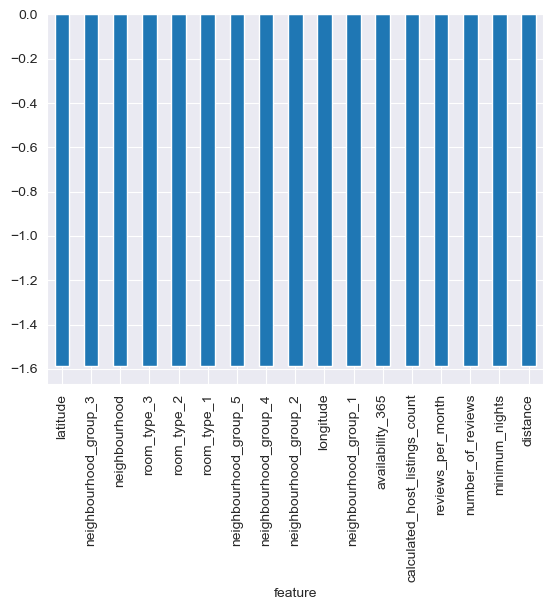

In [2264]:
# data_clean_leave_one_out
featureImportance.set_index('feature', inplace=True)
featureImportance.sort_values(["importance"], ascending=False, inplace=True)
featureImportance["importance"].plot.bar();

In [2265]:
# data_leave_one_out

model = LinearRegression()
model.fit(X_data_leave_one_out_minmax_train, y_data_leave_one_out_minmax_train)
y_pred = model.predict(X_data_leave_one_out_minmax_test)
y_train_pred = model.predict(X_data_leave_one_out_minmax_train)

print("Test MSE = %.2f" % mean_squared_error(y_data_leave_one_out_minmax_test, y_pred))
print("Train MSE = %.2f" % mean_squared_error(y_data_leave_one_out_minmax_train, y_train_pred))
print("Test MAE = %.2f" % mean_absolute_error(y_data_leave_one_out_minmax_test, y_pred))
print("Train MAE = %.2f" % mean_absolute_error(y_data_leave_one_out_minmax_train, y_train_pred))
print("Test RMSE = %.2f" % mean_squared_error(y_data_leave_one_out_minmax_test, y_pred, squared=False))
print("Train RMSE = %.2f" % mean_squared_error(y_data_leave_one_out_minmax_train, y_train_pred, squared=False))
print("Test R2 = %.2f" % r2_score(y_data_leave_one_out_minmax_test, y_pred))
print("Train R2 = %.2f" % r2_score(y_data_leave_one_out_minmax_train, y_train_pred))

Test MSE = 3390.16
Train MSE = 3235.67
Test MAE = 40.02
Train MAE = 39.20
Test RMSE = 58.23
Train RMSE = 56.88
Test R2 = 0.48
Train R2 = 0.48


In [2266]:
# data_leave_one_out
model.coef_

array([-1.02442615e+01,  3.98244460e-01, -1.34910116e+01, -1.81673624e+01,
        4.45599126e+00,  6.39712378e+00,  3.97279862e+01, -5.30260371e+12,
       -5.30260371e+12, -5.30260371e+12, -5.30260371e+12, -5.30260371e+12,
        7.03163798e+14,  7.03163798e+14,  7.03163798e+14,  1.49057143e+02,
       -8.15691675e+01])

In [2267]:
# data_leave_one_out
featureImportance = pd.DataFrame({"feature": data_leave_one_out.drop('price',axis=1).columns, 
                                  "importance": model.coef_[0]})
featureImportance

,feature,importance
0,latitude,-10.244261
1,longitude,-10.244261
2,minimum_nights,-10.244261
3,number_of_reviews,-10.244261
4,reviews_per_month,-10.244261
5,calculated_host_listings_count,-10.244261
6,availability_365,-10.244261
7,neighbourhood_group_1,-10.244261
8,neighbourhood_group_2,-10.244261
9,neighbourhood_group_3,-10.244261


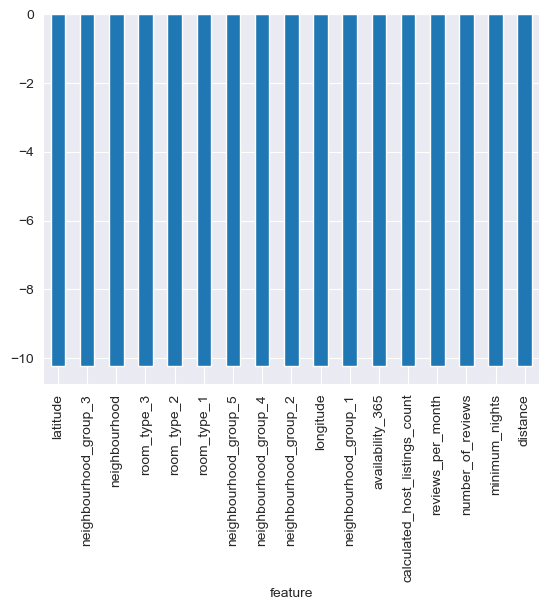

In [2268]:
# data_leave_one_out
featureImportance.set_index('feature', inplace=True)
featureImportance.sort_values(["importance"], ascending=False, inplace=True)
featureImportance["importance"].plot.bar();

### Этапы работы и выводы также написаны в начале в виде краткого резюме. 